In [16]:
library(Seurat)

library(SeuratWrappers)
library(tidyverse)

In [47]:
metabo_obj<- readRDS(file = "../results/new_html/all_samples_Clusters_metabo.rds")
metabo_obj

An object of class Seurat 
2814 features across 48172 samples within 1 assay 
Active assay: RNA (2814 features, 1000 variable features)
 5 dimensional reductions calculated: pca, harmony, umap, tsne, mca

In [1]:
markers <- readRDS(file = "../results/new_html/all_samples_cluster.markers_metabo.rds")

In [3]:
dim(markers)

[1] 2658   14

In [2]:
dim(markers[which(markers$cluster ==0),])
dim(markers[which(markers$cluster ==1),])
dim(markers[which(markers$cluster ==2),])
dim(markers[which(markers$cluster ==3),])
dim(markers[which(markers$cluster ==4),])
dim(markers[which(markers$cluster ==5),])
dim(markers[which(markers$cluster ==6),])
dim(markers[which(markers$cluster ==7),])
dim(markers[which(markers$cluster ==8),])
dim(markers[which(markers$cluster ==9),])
dim(markers[which(markers$cluster ==10),])


[1] 105  14

[1] 161  14

[1] 303  14

[1] 102  14

[1] 159  14

[1] 174  14

[1] 134  14

[1] 91 14

[1] 360  14

[1] 574  14

[1] 495  14

[1]  0 14

In [46]:
levels(as.factor(markers$cluster))

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10"

In [63]:
head(markers)
dim(markers)

,prolif_p_val,prolif_avg_log2FC,prolif_pct.1,prolif_pct.2,prolif_p_val_adj,diff_p_val,diff_avg_log2FC,diff_pct.1,diff_pct.2,diff_p_val_adj,max_pval,minimump_p_val,gene,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
USP1,0,0.5685590,0.915,0.367,0,0,0.6535001,0.903,0.382,0,0,0,USP1,0
PARP1,0,0.4688414,0.990,0.710,0,0,0.6271381,0.990,0.777,0,0,0,PARP1,0
DNM3,0,0.3194730,0.810,0.453,0,0,0.5564269,0.926,0.629,0,0,0,DNM3,0
UBE2T,0,0.6159302,0.929,0.372,0,0,1.2150648,0.951,0.227,0,0,0,UBE2T,0
BARD1,0,0.6690427,0.901,0.358,0,0,0.6838996,0.863,0.335,0,0,0,BARD1,0
DTYMK,0,0.4998778,0.914,0.451,0,0,0.6425537,0.893,0.414,0,0,0,DTYMK,0


[1] 2658   14

In [49]:
prolif <- markers[which( markers$diff_p_val == markers$max_pval), ]
dim(prolif)


diff <- markers[which( markers$prolif_p_val == markers$max_pval), ]
dim(diff)

[1] 1274   14

[1] 1662   14

In [37]:
table(rownames(prolif) == rownames(diff))

Warning message in rownames(prolif) == rownames(diff):
"la taille d'un objet plus long n'est pas multiple de la taille d'un objet plus court"



FALSE  TRUE 
 1613    49 

In [50]:
prolif <- prolif[, c('prolif_p_val', 'prolif_avg_log2FC', 'prolif_p_val_adj', 'gene', 'cluster' )]
head(prolif)
dim(prolif)

,prolif_p_val,prolif_avg_log2FC,prolif_p_val_adj,gene,cluster
,<dbl>,<dbl>,<dbl>,<chr>,<int>
USP1,0,0.5685590,0,USP1,0
PARP1,0,0.4688414,0,PARP1,0
DNM3,0,0.3194730,0,DNM3,0
UBE2T,0,0.6159302,0,UBE2T,0
BARD1,0,0.6690427,0,BARD1,0
DTYMK,0,0.4998778,0,DTYMK,0


[1] 1274    5

In [51]:
diff <- diff[, c('diff_p_val', 'diff_avg_log2FC', 'diff_p_val_adj', 'gene', 'cluster' )]
head(diff)
dim(diff)

,diff_p_val,diff_avg_log2FC,diff_p_val_adj,gene,cluster
,<dbl>,<dbl>,<dbl>,<chr>,<int>
USP1,0,0.6535001,0,USP1,0
PARP1,0,0.6271381,0,PARP1,0
DNM3,0,0.5564269,0,DNM3,0
UBE2T,0,1.2150648,0,UBE2T,0
BARD1,0,0.6838996,0,BARD1,0
DTYMK,0,0.6425537,0,DTYMK,0


[1] 1662    5

In [52]:
## remove genes that are both in prolif & diff (becauses of same values)
diff <- diff[! rownames(diff) %in% rownames(prolif),]
dim(diff)

[1] 1384    5

In [41]:
table(rownames(prolif) == rownames(diff))

Warning message in rownames(prolif) == rownames(diff):
"la taille d'un objet plus long n'est pas multiple de la taille d'un objet plus court"



FALSE 
 1384 

In [53]:
diff_markers <- diff[order(diff$diff_p_val_adj, decreasing = FALSE),]
prolif_markers <- prolif[order(prolif$prolif_p_val_adj, decreasing = FALSE),]

In [81]:
length(which(diff_markers$diff_p_val_adj == 0))
length(which(prolif_markers$prolif_p_val_adj == 0))

[1] 358

[1] 326

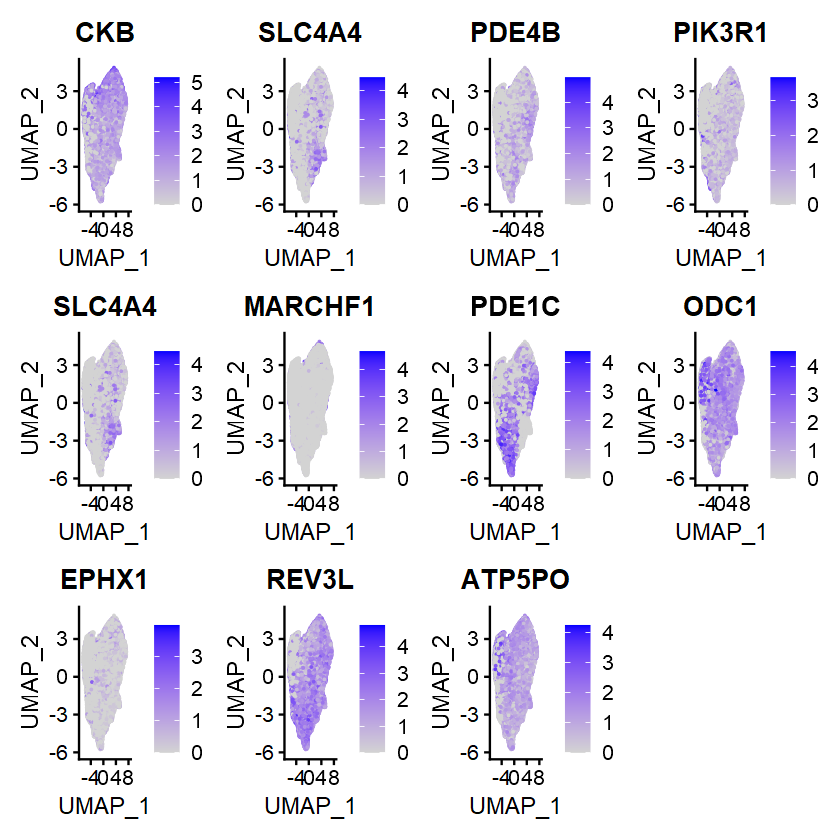

In [56]:
diff_markers %>%
    group_by(cluster) %>%
    top_n(n = 1, wt = diff_avg_log2FC) -> top10
FeaturePlot(metabo_obj, reduction="umap", features = top10$gene)

In [57]:
top10

diff_p_val,diff_avg_log2FC,diff_p_val_adj,gene,cluster
<dbl>,<dbl>,<dbl>,<chr>,<int>
0.000000e+00,0.7266237,0.000000e+00,CKB,0
0.000000e+00,1.5353096,0.000000e+00,SLC4A4,1
0.000000e+00,1.3920415,0.000000e+00,PDE4B,3
0.000000e+00,1.3216819,0.000000e+00,PIK3R1,5
2.381813e-171,1.4282714,6.702422e-168,SLC4A4,8
8.202246e-129,1.9463148,2.308112e-125,MARCHF1,10
5.337413e-125,1.9217051,1.501948e-121,PDE1C,6
3.131914e-59,0.8330968,8.813206e-56,ODC1,7
3.578631e-32,0.6798209,1.007027e-28,EPHX1,4


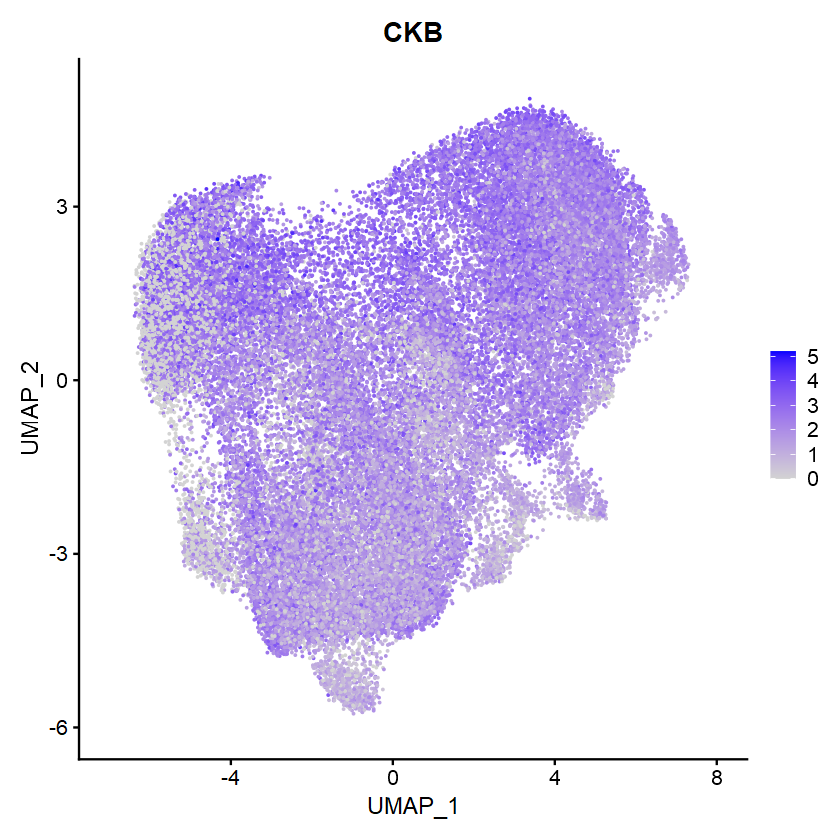

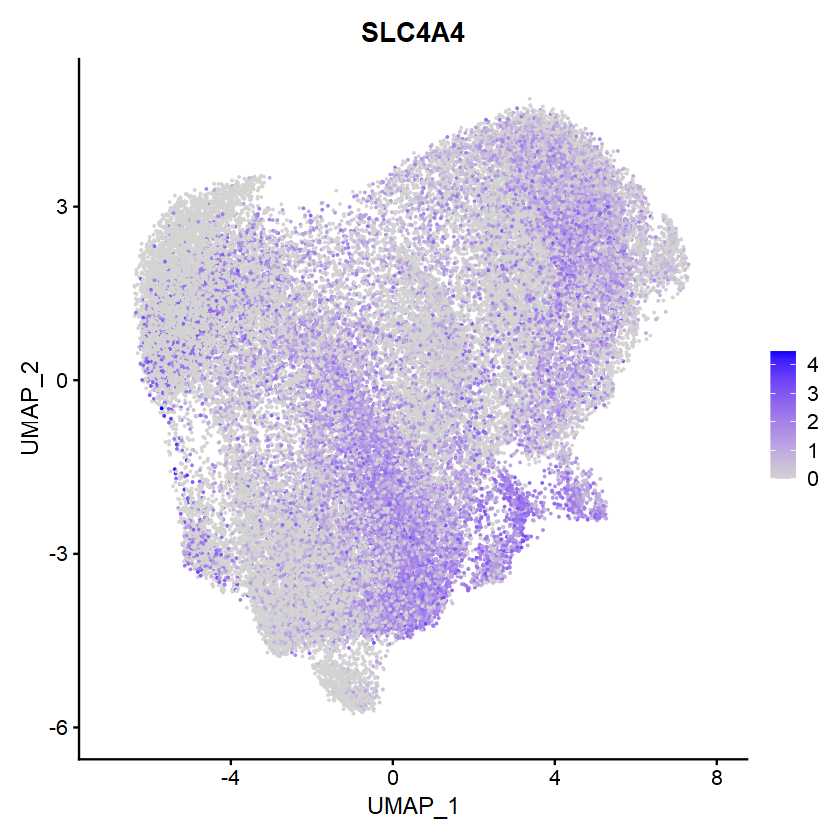

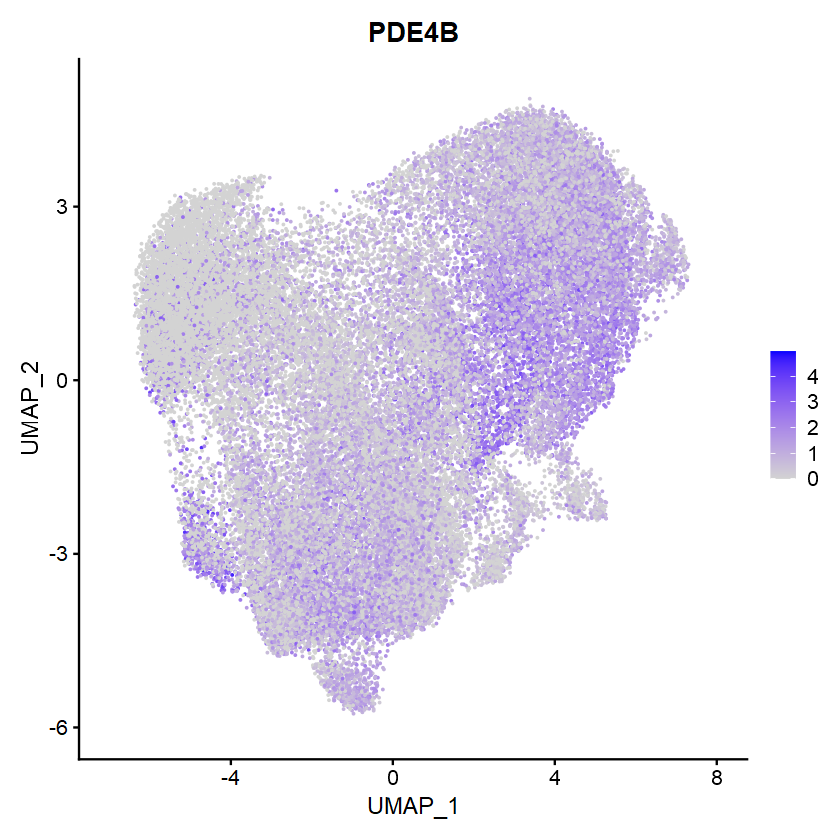

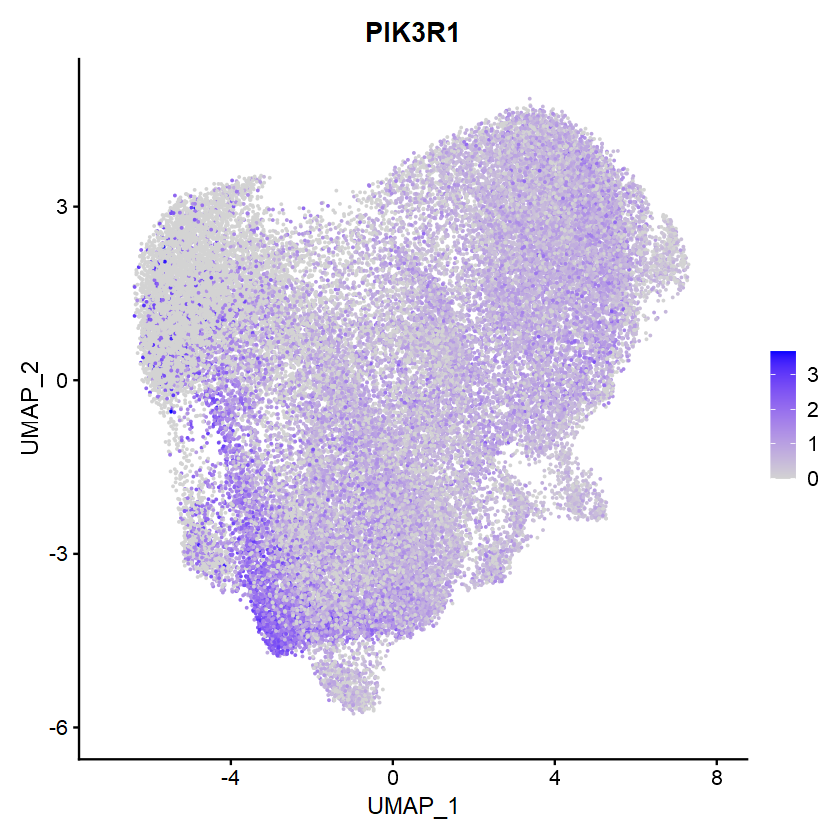

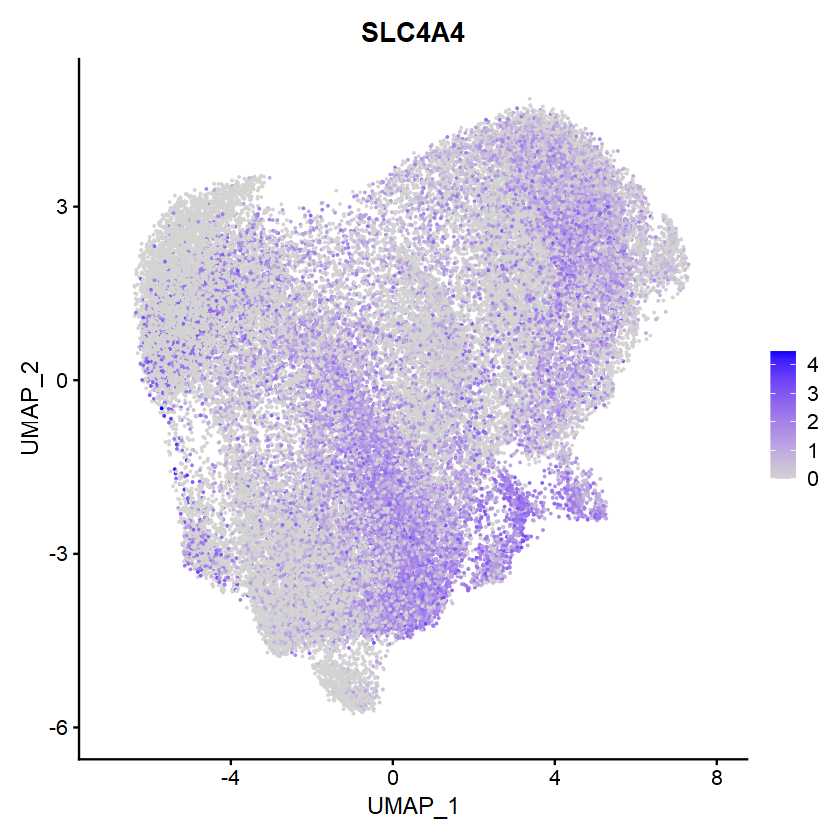

...

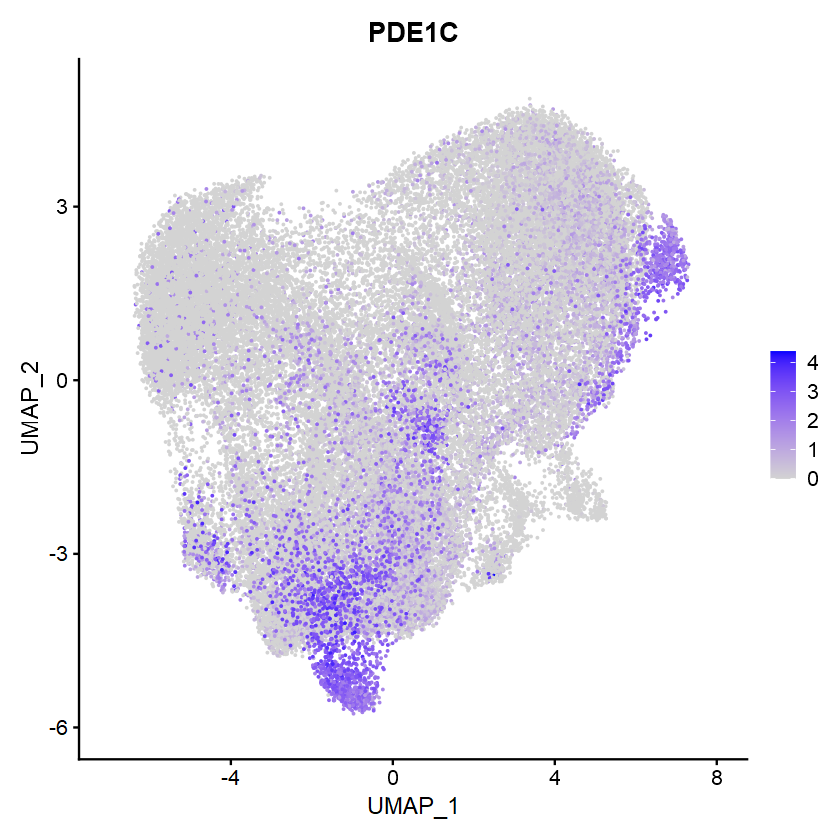

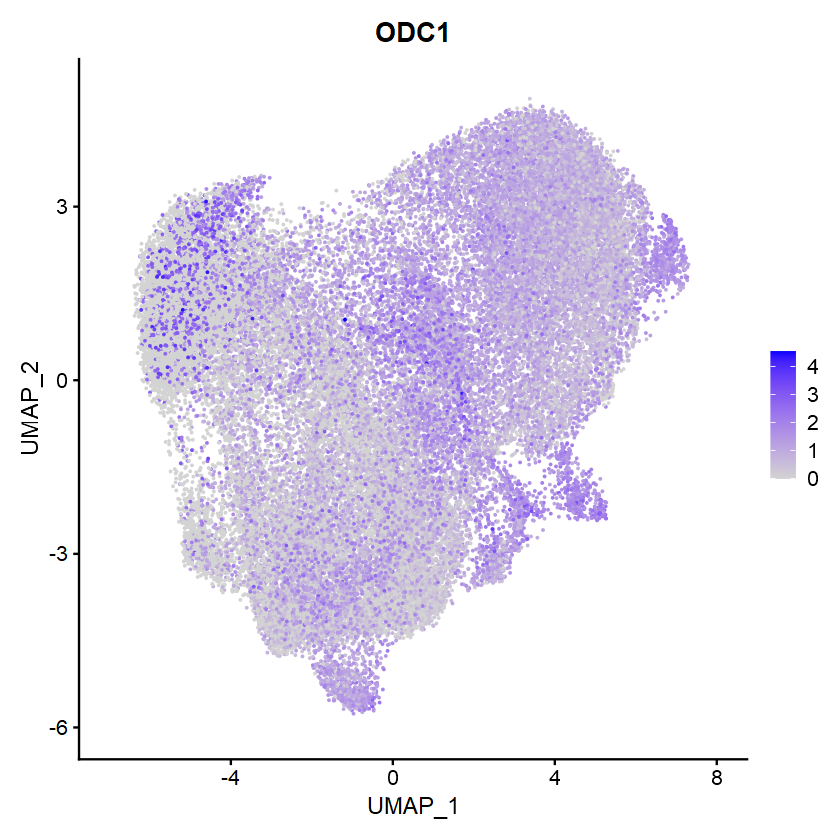

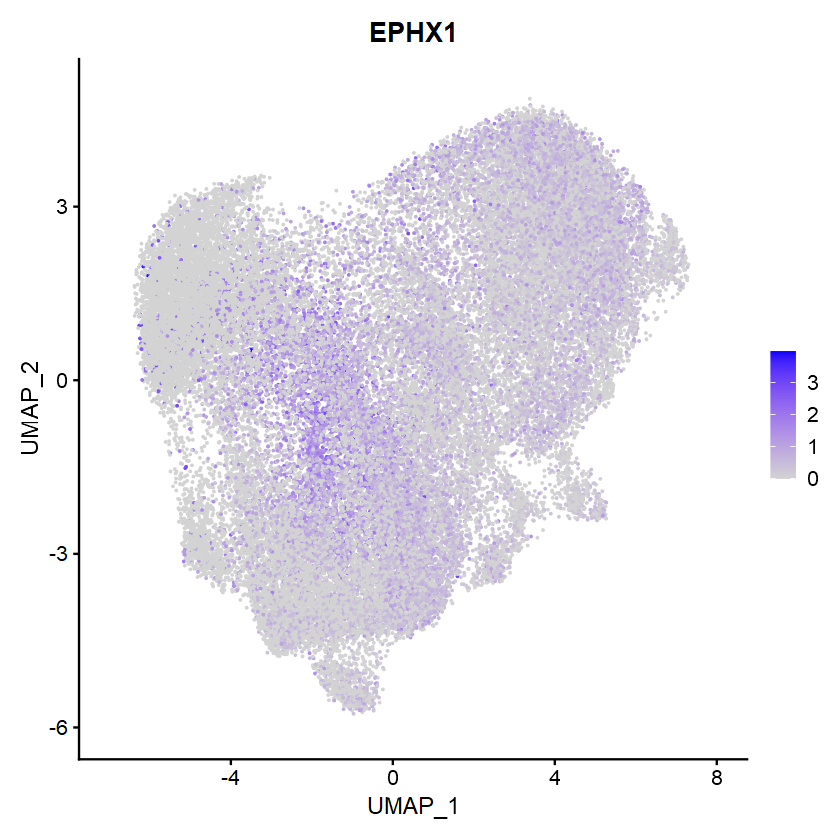

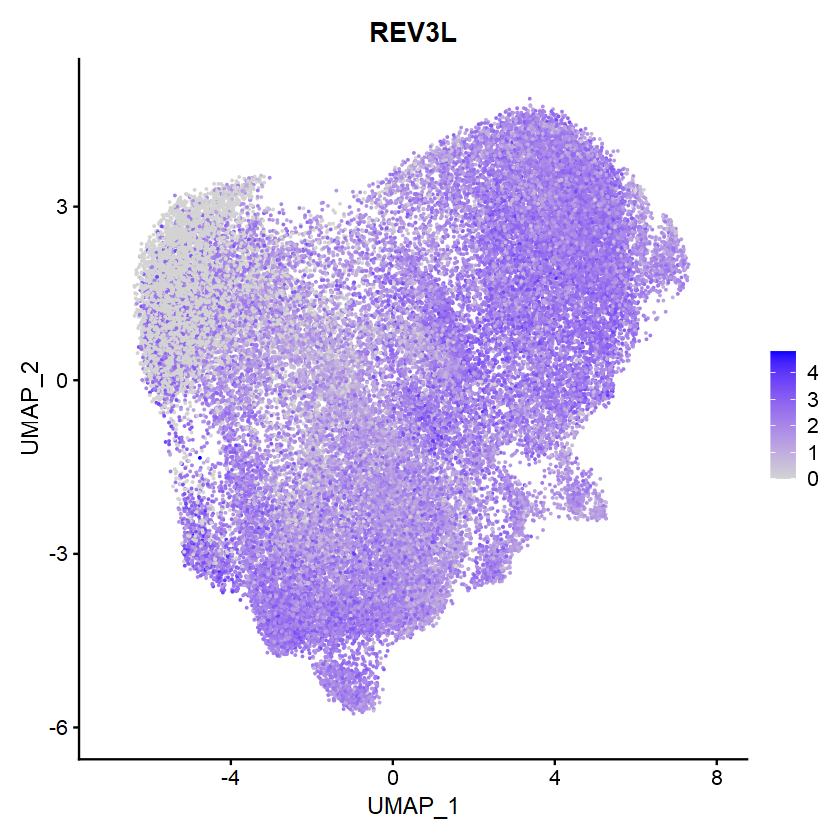

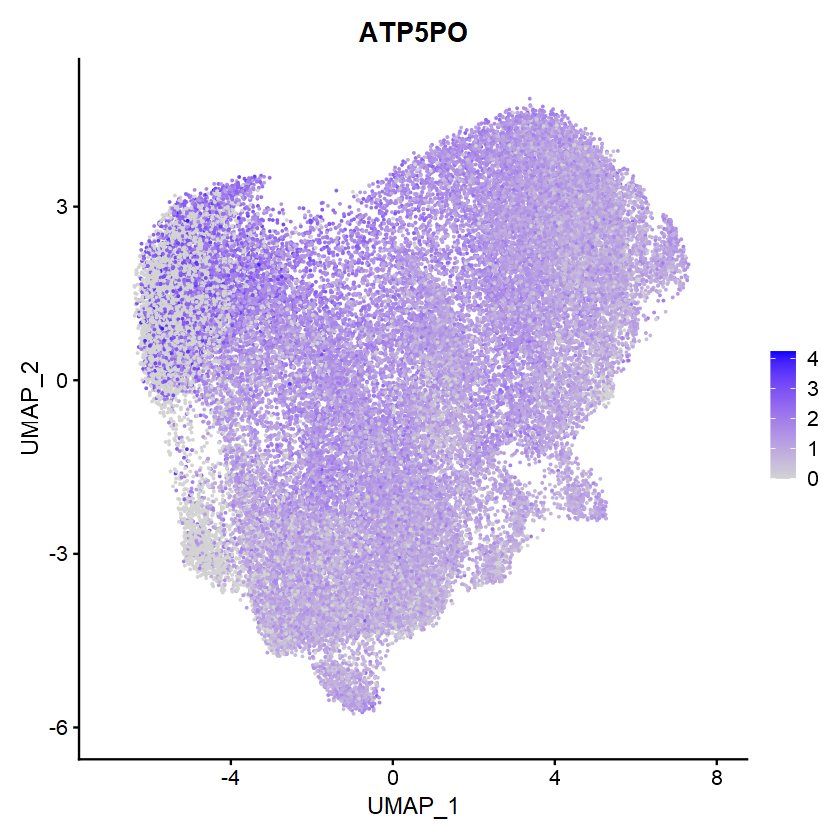

In [61]:
FeaturePlot(metabo_obj, reduction="umap", features = "CKB")
FeaturePlot(metabo_obj, reduction="umap", features = "SLC4A4")
FeaturePlot(metabo_obj, reduction="umap", features = "PDE4B")
FeaturePlot(metabo_obj, reduction="umap", features = "PIK3R1")
FeaturePlot(metabo_obj, reduction="umap", features = "SLC4A4")
FeaturePlot(metabo_obj, reduction="umap", features = "MARCHF1")
FeaturePlot(metabo_obj, reduction="umap", features = "PDE1C")
FeaturePlot(metabo_obj, reduction="umap", features = "ODC1")
FeaturePlot(metabo_obj, reduction="umap", features = "EPHX1")
FeaturePlot(metabo_obj, reduction="umap", features = "REV3L")
FeaturePlot(metabo_obj, reduction="umap", features = "ATP5PO")

In [58]:
prolif_markers %>%
    group_by(cluster) %>%
    top_n(n = 1, wt = prolif_avg_log2FC) -> top10_p
top10_p

prolif_p_val,prolif_avg_log2FC,prolif_p_val_adj,gene,cluster
<dbl>,<dbl>,<dbl>,<chr>,<int>
0.000000e+00,1.1036570,0.000000e+00,EZH2,0
0.000000e+00,1.7297548,0.000000e+00,APOE,1
0.000000e+00,0.8912932,0.000000e+00,ATP5F1D,4
0.000000e+00,2.0450380,0.000000e+00,SLCO2A1,8
1.135214e-248,0.8233295,3.194493e-245,HMGCS1,3
1.952216e-235,1.4104283,5.493535e-232,SLC3A2,7
1.858459e-152,1.1339383,5.229704e-149,ATP5MG,2
1.790828e-98,0.7201999,5.039389e-95,SLC1A3,6
2.267453e-45,1.0162368,6.380612e-42,PDE4B,5


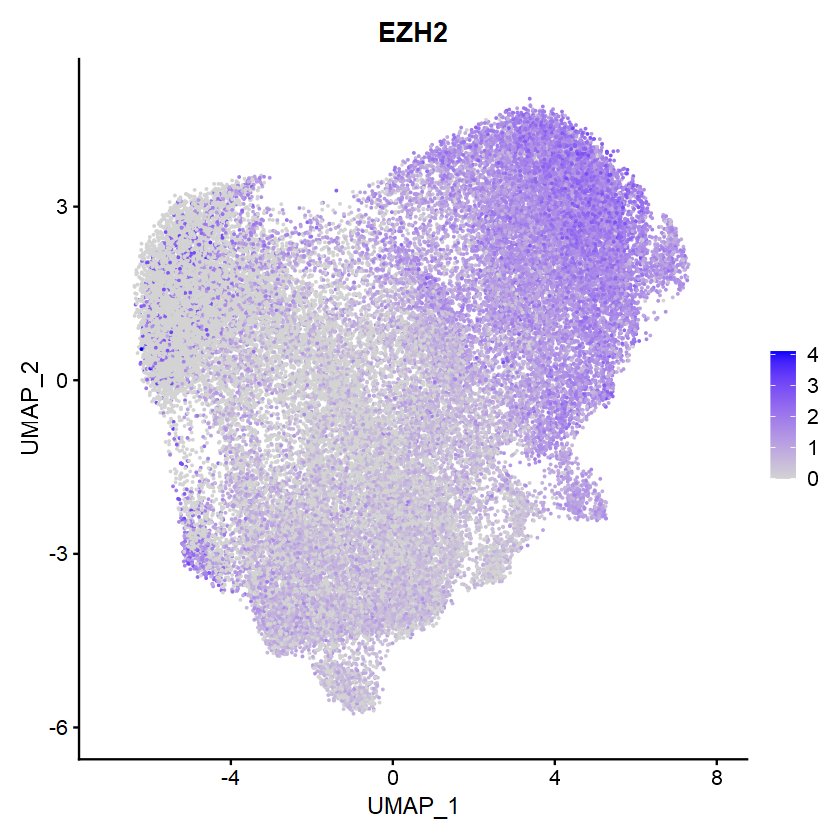

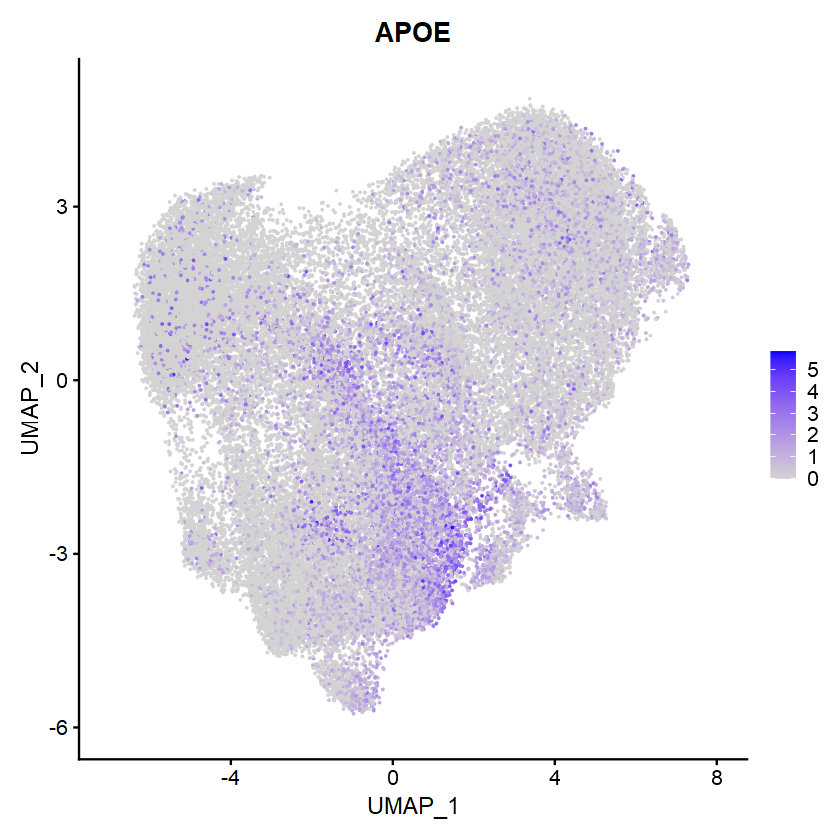

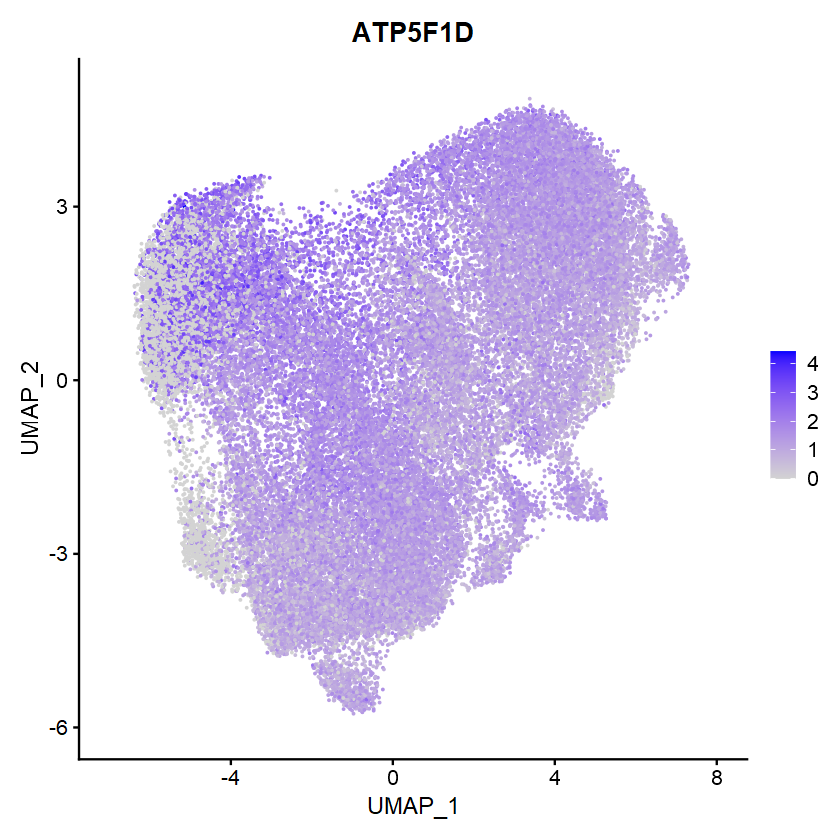

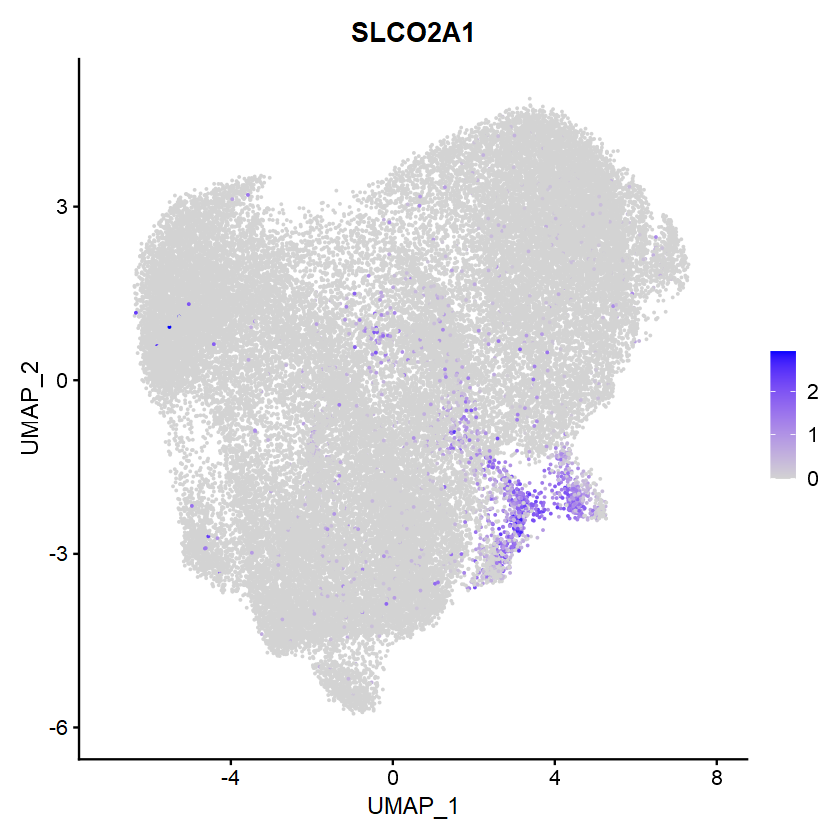

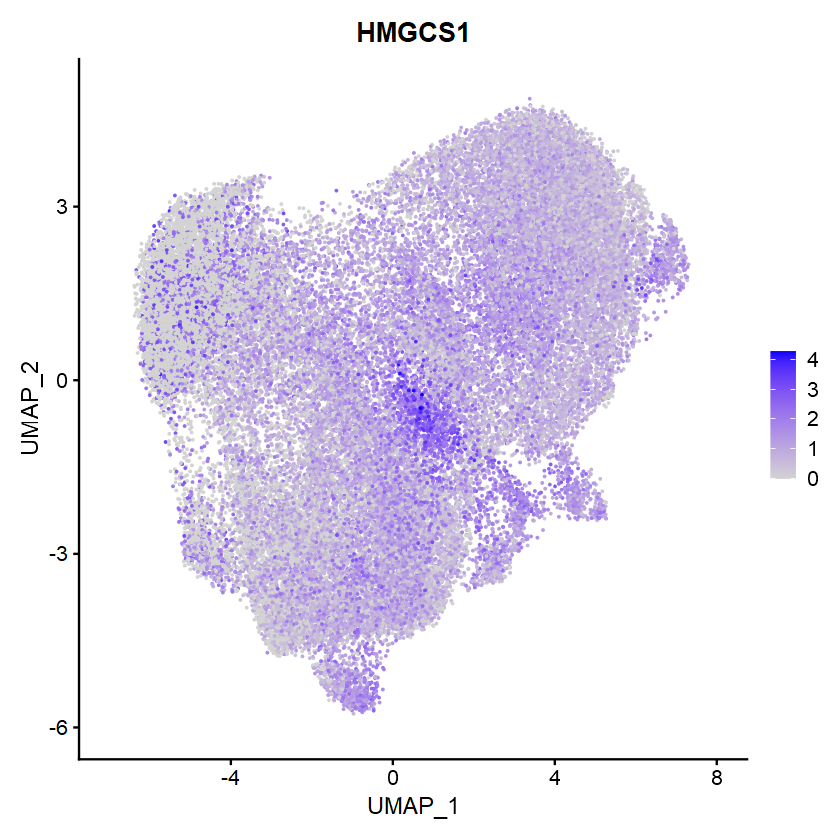

...

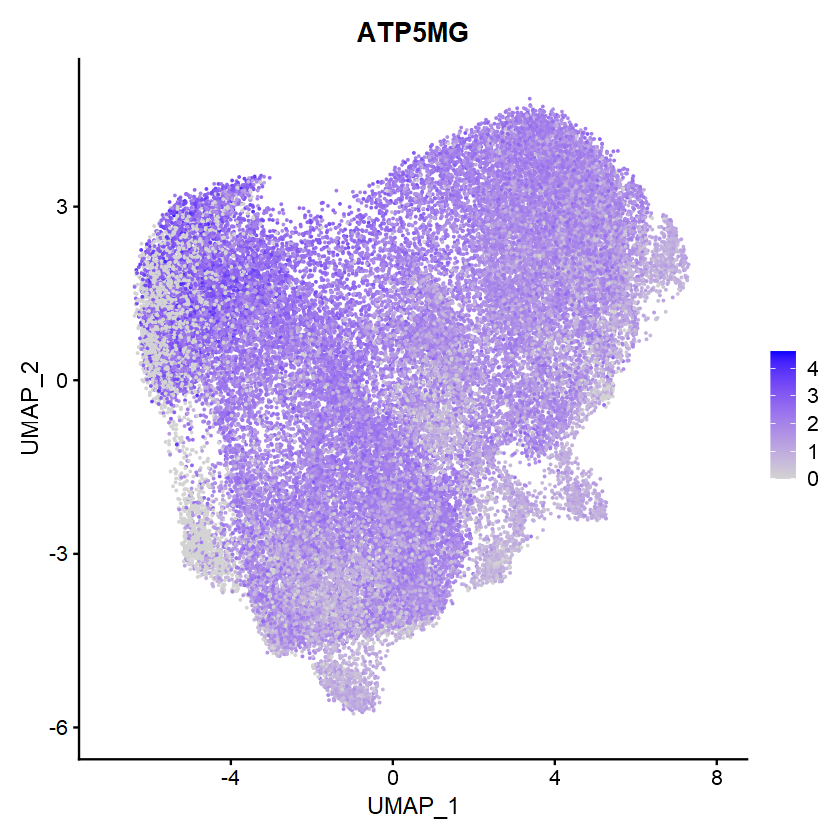

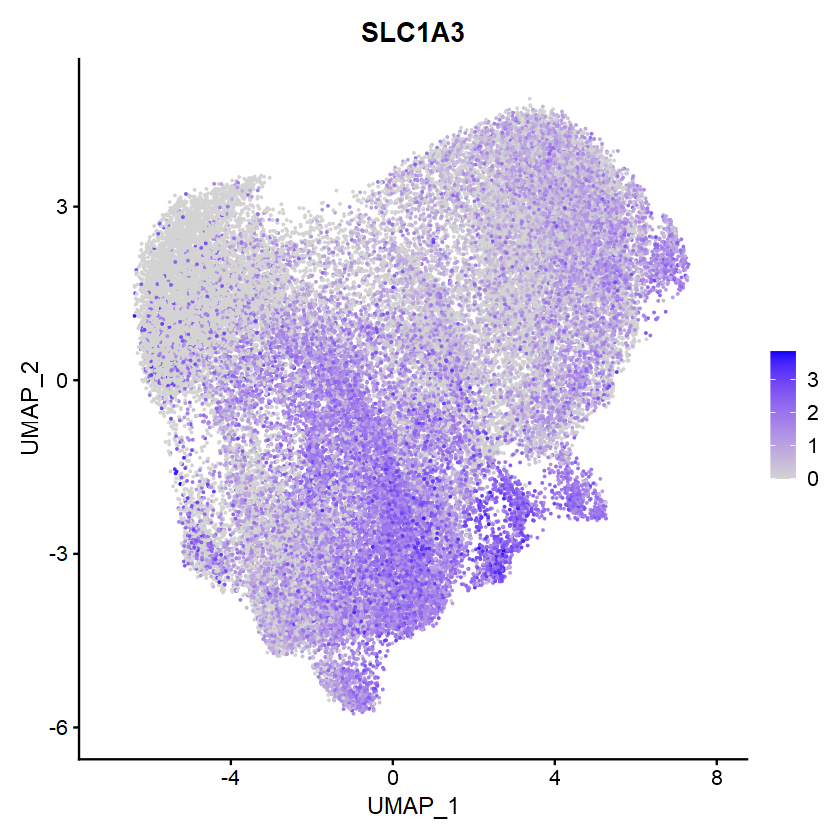

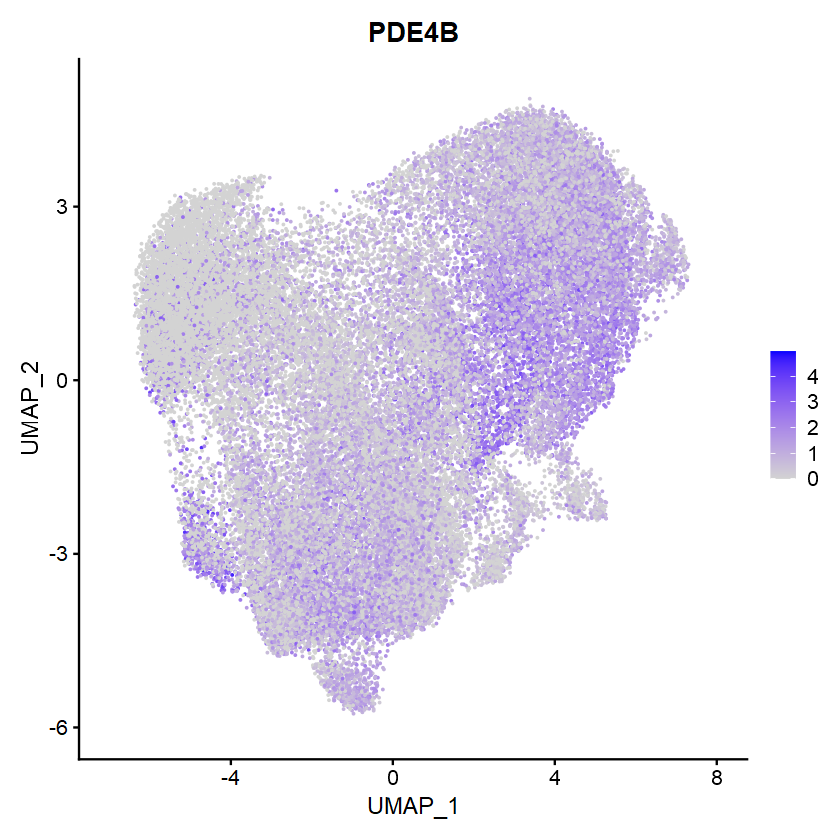

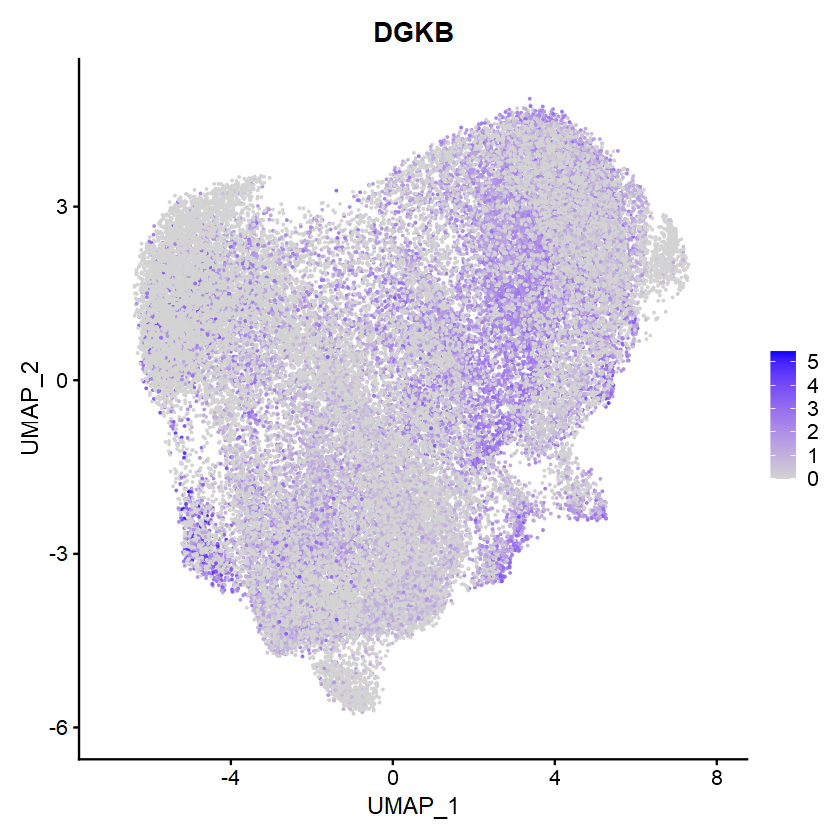

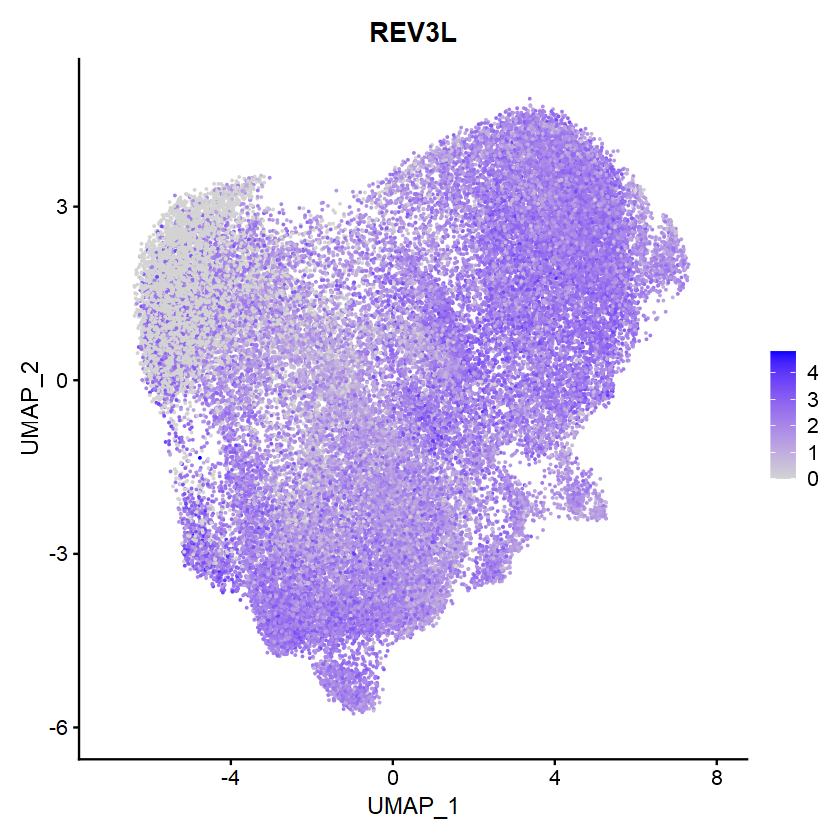

In [60]:
FeaturePlot(metabo_obj, reduction="umap", features = "EZH2")
FeaturePlot(metabo_obj, reduction="umap", features = "APOE")
FeaturePlot(metabo_obj, reduction="umap", features = "ATP5F1D")
FeaturePlot(metabo_obj, reduction="umap", features = "SLCO2A1")
FeaturePlot(metabo_obj, reduction="umap", features = "HMGCS1")
FeaturePlot(metabo_obj, reduction="umap", features = "SLC3A2")
FeaturePlot(metabo_obj, reduction="umap", features = "ATP5MG")
FeaturePlot(metabo_obj, reduction="umap", features = "SLC1A3")
FeaturePlot(metabo_obj, reduction="umap", features = "PDE4B")
FeaturePlot(metabo_obj, reduction="umap", features = "DGKB")
FeaturePlot(metabo_obj, reduction="umap", features = "REV3L")

# heatmap

diff_p_val,diff_avg_log2FC,diff_p_val_adj,gene,cluster
<dbl>,<dbl>,<dbl>,<chr>,<int>
0,1.2150648,0,UBE2T,0
0,1.2418989,0,RRM2,0
0,0.9036656,0,POLQ,0
0,1.0469430,0,DHFR,0
0,1.3085003,0,EZH2,0
0,0.8561187,0,POLA1,0


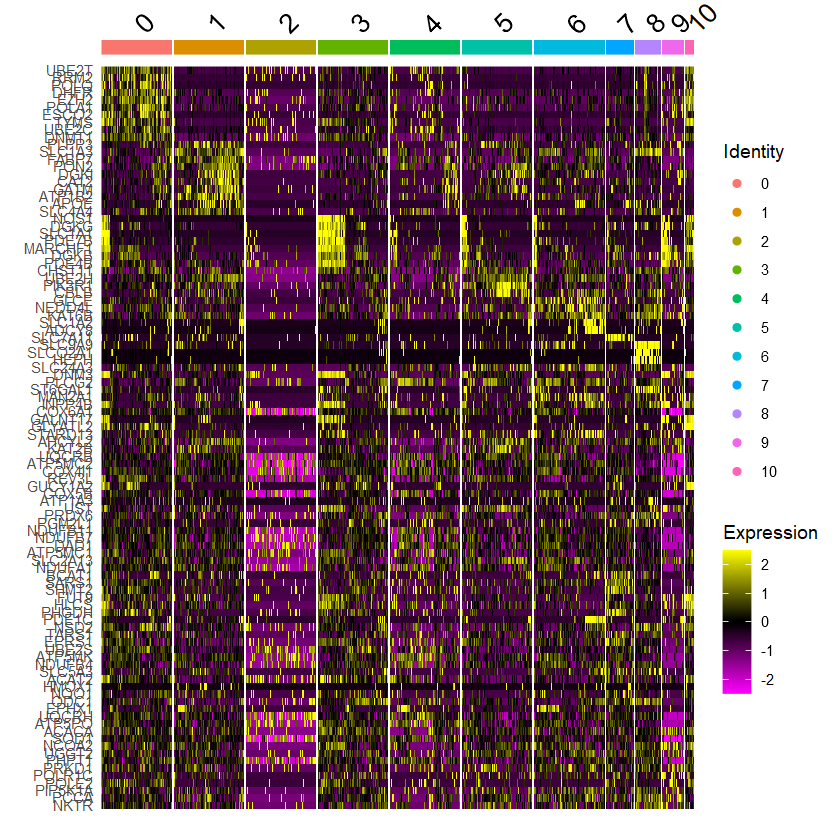

In [10]:
diff_markers %>%
    group_by(cluster) %>%
    top_n(n = 10, wt = diff_avg_log2FC) -> top10
DoHeatmap(subset(metabo_obj, downsample = 3000), 
          features = top10$gene)
head(top10)

In [23]:
rownames(metabo_obj)[,"PLCH2"]

ERROR: Error in rownames(metabo_obj)[, "PLCH2"]: nombre de dimensions incorrect


prolif_p_val,prolif_avg_log2FC,prolif_p_val_adj,gene,cluster
<dbl>,<dbl>,<dbl>,<chr>,<int>
0,1.0941152,0,RRM2,0
0,0.7802612,0,POLQ,0
0,0.6853256,0,NSD2,0
0,0.8926487,0,DHFR,0
0,1.1036570,0,EZH2,0
0,0.8999618,0,POLA1,0
0,0.7860411,0,ESCO2,0
0,0.7921832,0,DUT,0
0,0.6796028,0,WWOX,0


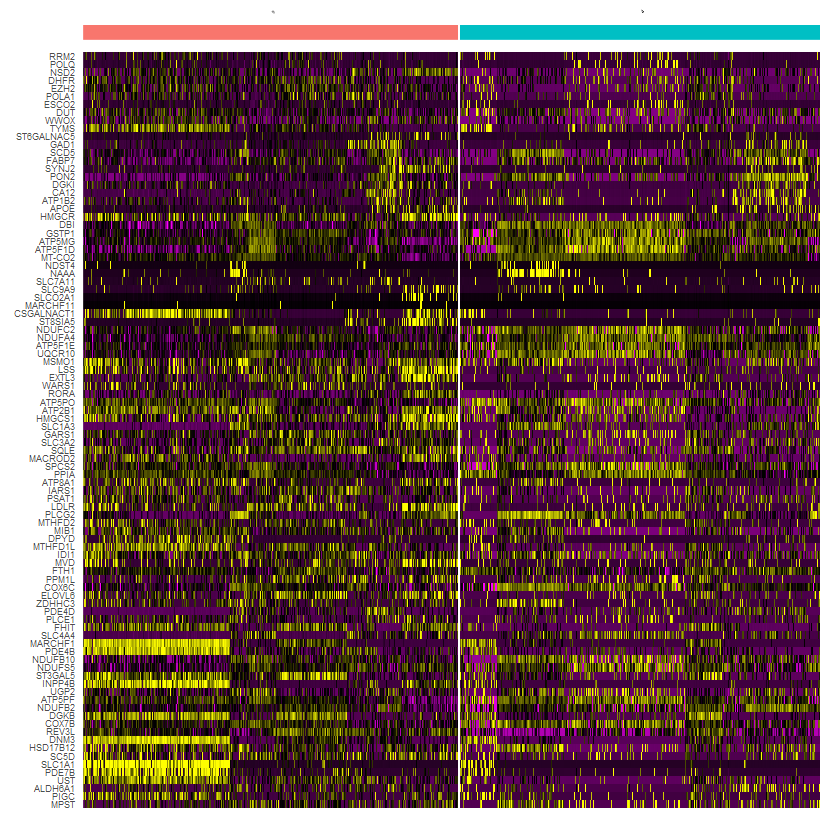

In [37]:
prolif_markers %>%
    group_by(cluster) %>%
    top_n(n = 10, wt = prolif_avg_log2FC) -> top10

new <- subset(metabo_obj, subset = seurat_clusters %in% c(3,4))
p <- DoHeatmap(new, features = top10$gene) + NoLegend()
p + theme(axis.text=element_text(size=5))
(top10)
